<h1 align="center">Fourier Transform Demo</h1>

    David Morley
    
    November 29, 2018

#### Experimentation with different properties and applications of the fourier transform.

In [1]:
import IPython
from matplotlib import pyplot as plt
import numpy as np
from scipy.io import wavfile
from scipy import fftpack
import time
from scipy import signal
import imageio

In [2]:
plt.rcParams["figure.dpi"] = 300             # Fix plot quality.
plt.rcParams["figure.figsize"] = (12,3)      # Change plot size / aspect (you may adjust this).

<h2 align="center">Part 1: Visualizing the Fourier Transform and Comparing Different Algorithms</h2>

### The class that does the bulk of the work

In [3]:
class SoundWave(object):
    """A class for working with digital audio signals."""


    def __init__(self, rate, samples):
        """Set the SoundWave class attributes.

        Parameters:
            rate (int): The sample rate of the sound.
            samples ((n,) ndarray): NumPy array of samples.
        """
        # Store each input as an attribute
        self.rate = rate
        self.samples = samples


    def plot(self,dft=False):
        """Plot the graph of the sound wave (time versus amplitude)."""
        # Save the number of samples in the set
        n = len(self.samples)        
        if dft:            
            plt.subplot(121)              # First subplot
            v = np.arange(n) * self.rate / n # Compute v in hertz
            frequencies = fftpack.fft(self.samples) # Take dft of samples
            plt.plot(v[:n//2],abs(frequencies[:n//2]*self.rate/n))
            plt.title("Frequencies vs Magnitude")
            plt.xlabel("Frequency (Hz)")  # Label axis
            plt.ylabel("Magnitude")            
            plt.xlim(left=0)
            plt.subplot(122)              # Change to 2nd subplot

        # Calculate the number of seconds in the sample
        num_seconds = n/self.rate
        y = np.linspace(0, num_seconds, n)
        plt.plot(y, self.samples, lw=.5)  # Plot samples vs time
        plt.title("Samples vs Time")
        plt.ylim(-32768, 32767)           # Use the given limits
        plt.xlabel("Time (Seconds)")      # Label axis
        plt.ylabel("Samples")  
        plt.show()                        # And show!
        

    def export(self, filename, force=False):
        """Generate a wav file from the sample rate and samples. 
        If the array of samples is not of type np.int16, scale it before exporting.

        Parameters:
            filename (str): The name of the wav file to export the sound to.
        """
        if type(samples) is not np.int16 or force:
            # Take only the real component
            real = np.real(self.samples)
            # Scale the samples
            scaled = np.int16((real * 32767.) / max(abs(real)))
            # Write to the file
            wavfile.write(filename, self.rate, scaled)
        else:
            wavfile.write(filename, self.rate, self.samples)
    

    def __add__(self, other):
        """Combine the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to add
                to the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the combined samples.

        Raises:
            ValueError: if the two sample arrays are not the same length.
        """
        # Check that rates are matching
        if self.rate != other.rate:
            raise ValueError("A and B are not the same length")
        # Add together the samples to generate new sound
        sums = self.samples + other.samples
        # Return new sound as a SoundWave object
        return SoundWave(self.rate, sums)


    def __rshift__(self, other):
        """Concatentate the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to concatenate
                to the samples contained in this object.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        # Check that rates are matching
        if self.rate != other.rate:
            raise ValueError("A and B are not the same length")
        # Concatenate  the samples to generate new sound
        concat = np.concatenate((self.samples, other.samples))
        # Return new sound as a SoundWave object
        return SoundWave(self.rate, concat)
    

    def __mul__(self, other):
        """Convolve the samples from two SoundWave objects using circular convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        n = len(self.samples)
        m = len(other.samples)        
        # Check that rates are matching
        if self.rate != other.rate:
            raise ValueError("A and B are not the same length")  
        # Pad smaller array
        if n < m:
            pad = np.zeros(m-n)
            self.samples = np.concatenate([self.samples, pad])
        else:
            pad = np.zeros(n-m)
            other.samples = np.concatenate([other.samples, pad])    
        # Use 7.4 to compute convolution
        convolve = fftpack.ifft(fftpack.fft(self.samples)*fftpack.fft(other.samples)).real
        return SoundWave(self.rate, convolve)


    def __pow__(self, other):
        """Convolve the samples from two SoundWave objects using linear convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        # Check that rates are matching
        if self.rate != other.rate:
            raise ValueError("A and B are not the same length")  
        # Store lengths of sample vectors
        n = len(self.samples)
        m = len(other.samples)
        # Set a to be the smallest value such that 2**a >= n + m - 1
        a = int(np.ceil(np.log2(n+m-1)))
        # Initialize zero vectors for padding
        selfNew = np.zeros(2**a)
        otherNew = np.zeros(2**a)
        # Use fancy indexing to 'append' zeros
        selfNew[:n] = self.samples
        otherNew[:m] = other.samples
        # Compute the convolution
        convolve = fftpack.ifft(fftpack.fft(selfNew)*fftpack.fft(otherNew))[:n+m-1].real
        return SoundWave(self.rate, convolve)        
        

    def clean(self, low_freq, high_freq):
        """Remove a range of frequencies from the samples using the DFT. 

        Parameters:
            low_freq (float): Lower bound of the frequency range to zero out.
            high_freq (float): Higher boound of the frequency range to zero out.
        """
        # Initialize useful values
        n = len(self.samples) 
        k_high = int(round(high_freq * n / self.rate))
        k_low = int(round(low_freq * n / self.rate))
        # Compute the dft of the samples
        samples = self.samples.copy()
        dft = fftpack.fft(self.samples)
        # Set outlying frequencies to zero
        dft[k_low:k_high] = 0
        dft[n-k_high:n-k_low] = 0
                
        return SoundWave(self.rate, fftpack.ifft(dft))    
                

### Read in and visualize the fourier transform of a sample file.

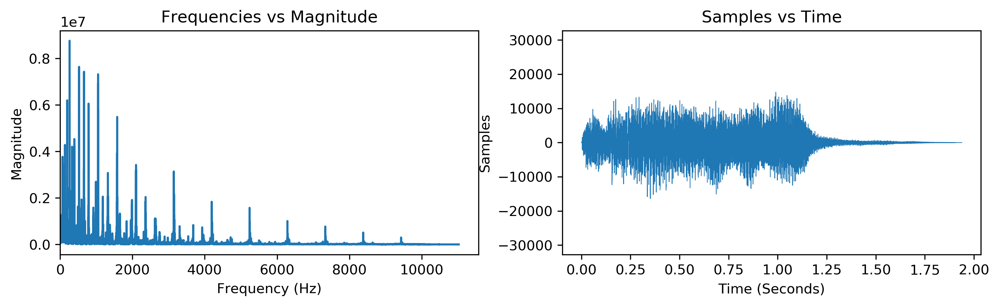

In [45]:
# Read in the soundfile saving the rate and samples
rate, samples = wavfile.read("tada.wav")
# Generate a Soundwave class object
tada=SoundWave(rate, samples)
# Use the plot function
tada.plot(dft=True)

### Code up the discrete fourier transform and compare with the scipy package

In [12]:
def simple_dft(samples):
    """Compute the DFT of an array of samples.

    Parameters:
        samples ((n,) ndarray): an array of samples.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    # Initialize size of input vector
    n = len(samples)
    # Create a vector of values of k
    k = np.arange(n).reshape(n,1)
    # Use formula and aray broadcasting to create W
    W = np.exp(-2*np.pi*1j/n * k @ k.T)
    # Return dft
    return np.array(W @ samples / n)

In [42]:
# Choose size of test vector
n = 4
# Create test vector
test_array = np.random.random(n)
# Compute DFTs
myC = 4 * simple_dft(test_array)
scipyC = fftpack.fft(test_array)
# Compare sizes
print("All values match?", np.allclose(myC, scipyC))

All values match? True


### Code up the fast fourier transform and compare with the scipy package

In [14]:
def simple_fft(samples, threshold=1):
    """Compute the DFT using the FFT algorithm.
    
    Parameters:
        samples ((n,) ndarray): an array of samples.
        threshold (int): when a subarray of samples has fewer
            elements than this integer, use simple_dft() to
            compute the DFT of that subarray.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    # Initialize length of sample vector
    n = len(samples)
    # If it's less than the threshold, use the simple dft
    if n <= threshold:
        return simple_dft(samples)
    else:
        # Break up sample vector by evens and odds and run function recursively
        f_even = simple_fft(samples[::2])
        f_odd = simple_fft(samples[1::2])
        # Create w vector
        w = np.exp((-2j * np.pi/n) * np.arange(n))
        # Break up output by first and second half
        first_sum = f_even + w[:n//2] * f_odd
        second_sum = f_even + w[n//2:] * f_odd
        # Return the scaled full fft
        return .5 * np.concatenate([first_sum, second_sum])

In [43]:
# Choose the number of samples to use
n = 8192
# Create the test array
test_array = np.random.random(n)
# Run the simple dft
start = time.time()
dft = n * simple_dft(test_array)
dft_time = time.time() - start
# Run the simple fft
start = time.time()
fft = n * simple_fft(test_array)
fft_time = time.time() - start
# Run the scipy implementation
start = time.time()
scipy = fftpack.fft(test_array)
scipy_time = time.time() - start
print(f"simple_dft: {dft_time} seconds\nsimple_fft: {fft_time} seconds\nscipy.fftpack.fft: {scipy_time} seconds")
print("All values match?", np.allclose(fft, scipy))

simple_dft: 8.289896011352539 seconds
simple_fft: 0.4976944923400879 seconds
scipy.fftpack.fft: 0.0009992122650146484 seconds
All values match? True


<h2 align="center">Part 2: Convolution and Filtering</h2>

### Use circular convolution to increase duration of sound byte.
By convolving white noise with the audio file, we stretch the whole file.

In [19]:
rate = tada.rate        # Create 2 seconds of white noise at a given rate.
white_noise = np.random.randint(-32767, 32767, rate*2, dtype=np.int16)
white = SoundWave(rate, white_noise)
# Convolve white noise and tada sound
white_convolve = white * tada
IPython.display.Audio(rate=rate, data=white_convolve.samples)

In [20]:
# Append circular convolution to itself
full_track = white_convolve >> white_convolve
IPython.display.Audio(rate=rate, data=full_track.samples)

### Use linear convolution to change characteristics of sound byte.
By convolving a regular recording with an echo, we can make the recording sound like it's in a large hall.

In [26]:
# Embed chopin sound
chopin_rate, chopin_samples = wavfile.read("chopin.wav")
IPython.display.Audio("chopin.wav")

In [27]:
# Embed Balloon sound
balloon_rate, balloon_samples = wavfile.read("balloon.wav")
IPython.display.Audio("balloon.wav")

In [28]:
# Compute and embed convolution of balloon and chopin
convo = signal.fftconvolve(chopin_samples, balloon_samples)
IPython.display.Audio(rate=chopin_rate, data=convo)

### Filtering
By trimming out frequencies with a lot of noise, we can clean audio files.  
#### Apollo 11

In [29]:
# Embed first soundfile
noisy1 = SoundWave(wavfile.read("noisy1.wav")[0], wavfile.read("noisy1.wav")[1])
IPython.display.Audio("noisy1.wav")

In [30]:
# Clean first sound file
clean1 = noisy1.clean(1250, 2600)
IPython.display.Audio(rate=noisy1.rate, data=clean1.samples)

c:\users\dcm96\anaconda3\lib\site-packages\IPython\lib\display.py:124: ComplexWarning: Casting complex values to real discards the imaginary part
  data = np.array(data, dtype=float)


### Vuvuzelas

In [34]:
# Read in sound files separately to get both channels
vuvuzelaA = SoundWave(wavfile.read("vuvuzela.wav")[0], wavfile.read("vuvuzela.wav")[1][:,0])
vuvuzelaB = SoundWave(wavfile.read("vuvuzela.wav")[0], wavfile.read("vuvuzela.wav")[1][:,1])
# Embed original sound
IPython.display.Audio(rate=vuvuzelaA.rate, data=np.array([vuvuzelaA.samples,vuvuzelaB.samples]))

In [40]:
# Clean frequencies
cleanA = vuvuzelaA.clean(200,500)
cleanB = vuvuzelaB.clean(200,500)
# Recombine channels
cleanStereo = np.vstack((cleanA.samples, cleanB.samples))
IPython.display.Audio(rate=cleanA.rate, data=cleanStereo)

c:\users\dcm96\anaconda3\lib\site-packages\IPython\lib\display.py:124: ComplexWarning: Casting complex values to real discards the imaginary part
  data = np.array(data, dtype=float)
